In [ ]:
pip install pysus

In [ ]:
import sys

!"{sys.executable}" -m pip install -U pandas-profiling[notebook]
!jupyter nbextension enable --py widgetsnbextension

In [16]:
from pysus.online_data import SINAN
import pysus.demography
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import sweetviz as sv
from pandas_profiling import ProfileReport

In [4]:
SINAN.list_diseases()

['Animais Peçonhentos',
 'Botulismo',
 'Chagas',
 'Colera',
 'Coqueluche',
 'Dengue',
 'Difteria',
 'Esquistossomose',
 'Febre Amarela',
 'Febre Maculosa',
 'Febre Tifoide',
 'Hanseniase',
 'Hantavirose',
 'Hepatites Virais',
 'Intoxicação Exógena',
 'Leishmaniose Visceral',
 'Leptospirose',
 'Leishmaniose Tegumentar',
 'Malaria',
 'Meningite',
 'Peste',
 'Poliomielite',
 'Raiva Humana',
 'Tétano Acidental',
 'Tétano Neonatal',
 'Tuberculose',
 'Violência Domestica']

In [5]:
SINAN.get_available_years('SP', 'Malaria')

['MALASP07.dbc',
 'MALASP08.dbc',
 'MALASP09.dbc',
 'MALASP10.dbc',
 'MALASP11.dbc',
 'MALASP12.dbc',
 'MALASP13.dbc',
 'MALASP14.dbc',
 'MALASP15.dbc',
 'MALASP16.dbc',
 'MALASP17.dbc']

In [6]:
df = SINAN.download('SP',2017,'Malaria')
df.head()

,TP_NOT,ID_AGRAVO,DT_NOTIFIC,SEM_NOT,NU_ANO,SG_UF_NOT,ID_MUNICIP,ID_REGIONA,ID_UNIDADE,DT_SIN_PRI,SEM_PRI,DT_NASC,NU_IDADE_N,CS_SEXO,CS_GESTANT,CS_RACA,CS_ESCOL_N,SG_UF,ID_MN_RESI,ID_RG_RESI,ID_PAIS,DT_INVEST,ID_OCUPA_N,CLASSI_FIN,AT_ATIVIDA,AT_LAMINA,AT_SINTOMA,TPAUTOCTO,COUFINF,COPAISINF,COMUNINF,LOC_INF,DEXAME,RESULT,PMM,PCRUZ,TRA_ESQUEM,DSTRAESQUE,DTRATA,DT_ENCERRA
0,2,B54,2017-01-04,201701,2017,35,355580,1574,2073250,2016-12-28,201652,1974-12-22,4042,M,6,1,05,35,355580,1574,1,None,782505,1,10,1,1,2,AM,1,130170,,2017-01-04,4,NaN,3,1,,2017-01-04,None
1,2,B54,2017-01-05,201701,2017,35,354980,1354,2077396,2017-01-01,201701,1985-09-09,4031,M,6,1,03,35,353280,1354,1,None,,2,4,2,1,,,0,,,2017-01-05,1,NaN,,,,None,None
2,2,B54,2017-01-10,201702,2017,35,354140,1346,2755130,2016-10-10,201641,1977-11-25,4038,F,5,2,06,35,354140,1346,1,None,,2,3,1,1,,,0,,,2017-01-10,1,NaN,,,,None,None
3,2,B54,2017-01-10,201702,2017,35,351550,1574,2076047,2017-01-01,201701,1990-05-03,4026,F,5,1,04,35,351550,1574,1,None,632205,2,1,1,2,,,0,,,2017-01-10,1,NaN,,,,None,None
4,2,B54,2017-01-11,201702,2017,35,355030,1331,2077477,2017-01-06,201701,2004-06-14,4012,M,6,2,09,35,355030,1331,1,None,,2,99,1,1,,,0,,,2017-01-11,1,NaN,,,,None,None


In [7]:
def altera_tipos(df):
  for columns in df.columns:
      if columns.startswith("DT_"):
          df[columns] = df[columns].astype('datetime64[ns]')
      elif columns == 'NU_ANO':
          df[columns] = df[columns].astype(int)
      elif columns == 'RESUL_HIS':
          df[columns] = df[columns].astype(str)
      else:
          try:
              df[columns] = df[columns].astype(int)
          except:
              try:
                  df[columns] = df[columns].astype(float)
              except:
                  df[columns] = df[columns].astype(str)

altera_tipos(df)

In [ ]:
df.info()

# Malária na Amazônia


In [10]:
SINAN.get_available_years('AM', 'Malaria')

['MALAAM07.dbc',
 'MALAAM08.dbc',
 'MALAAM09.dbc',
 'MALAAM10.dbc',
 'MALAAM11.dbc',
 'MALAAM12.dbc',
 'MALAAM13.dbc',
 'MALAAM14.dbc',
 'MALAAM15.dbc',
 'MALAAM16.dbc',
 'MALAAM17.dbc']

In [11]:
malaria_AM17 = SINAN.download('AM', 2017, 'Malaria')
malaria_AM16 = SINAN.download('AM', 2016, 'Malaria')

altera_tipos(malaria_AM16)
altera_tipos(malaria_AM17)

In [ ]:
malaria_AM16.head()

In [ ]:
malaria_AM17.head()

## Usando Pandas profiling para analisar os df's

In [18]:
profile = ProfileReport(malaria_AM16, title="Report da malaria na AM em 2016")
profile

Summarize dataset:   0%|          | 0/53 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [19]:
profile = ProfileReport(malaria_AM17, title="Report da malaria na AM em 2017")
profile

Summarize dataset:   0%|          | 0/53 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Usando sweetviz para analisar os df's

separando apenas as 20 primeiras colunas

In [28]:
malaria_AM16_selection = malaria_AM16[0:20]
malaria_AM17_selection = malaria_AM17[0:20]

criando e mostrando o report do sweetviz

In [29]:
comparison_report = sv.compare([malaria_AM16_selection, "malaria 2016 AM"], [malaria_AM17_selection, "malaria 2017 AM"])

                                             |          | [  0%]   00:00 -> (? left)


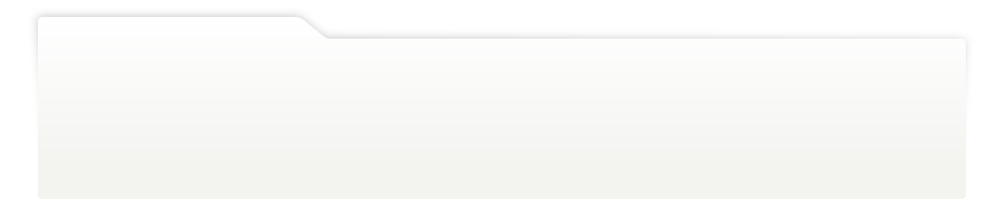
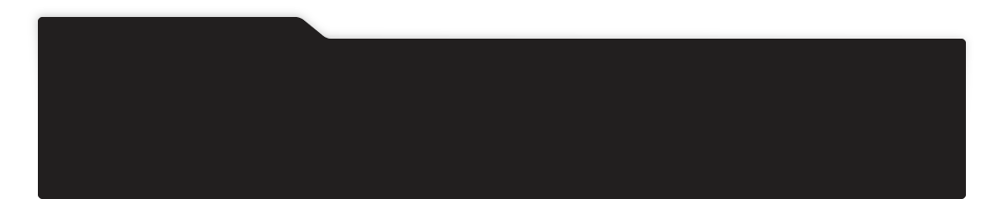
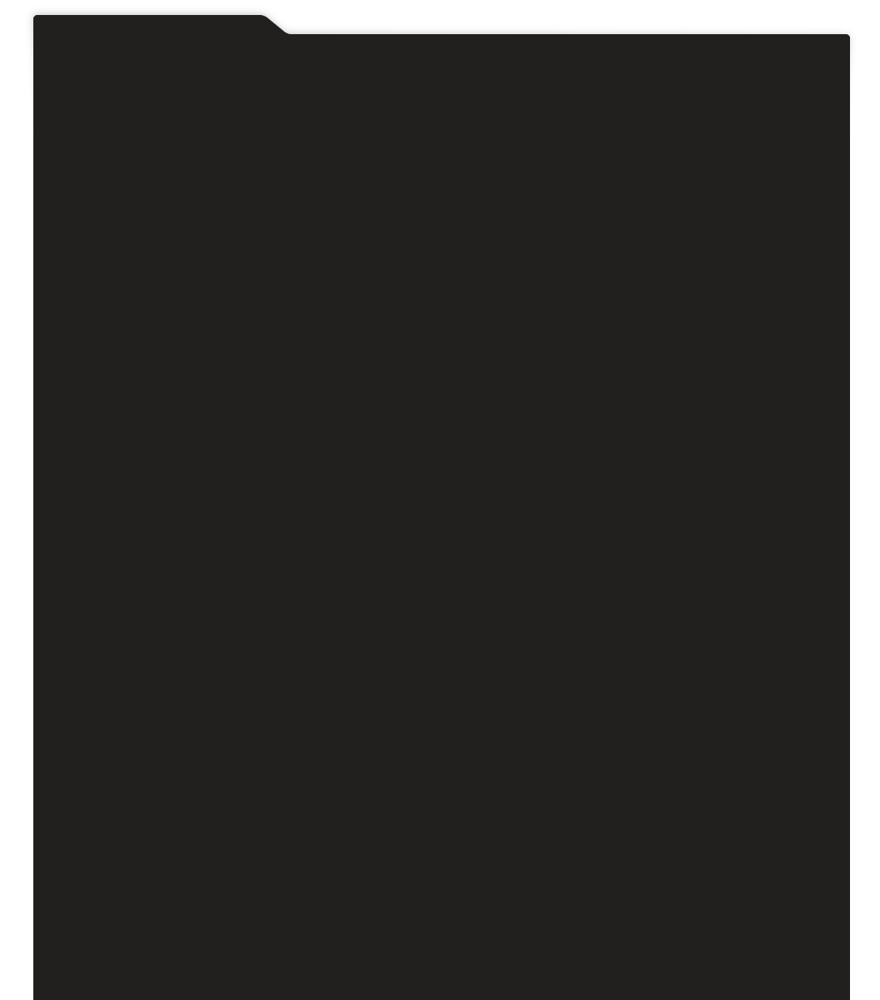
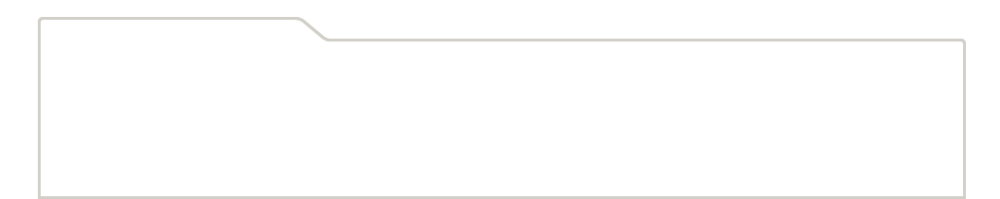
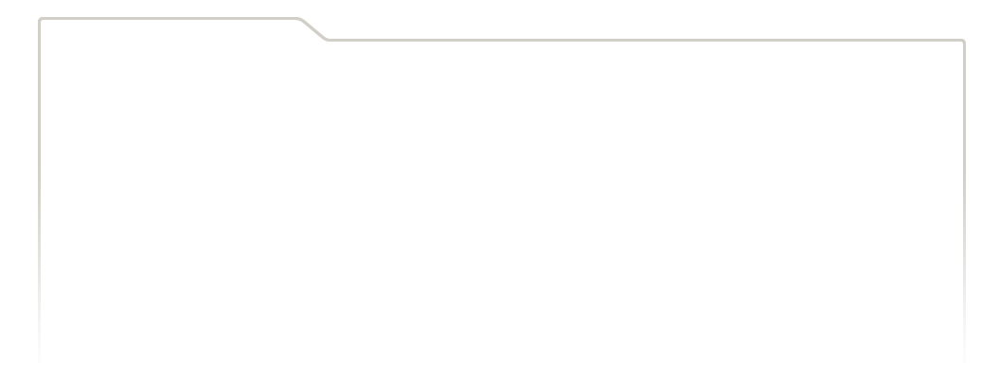
...
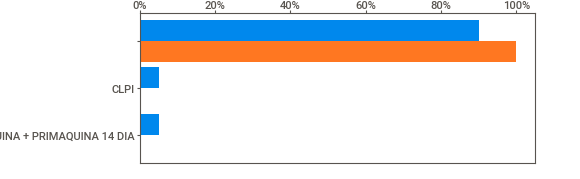
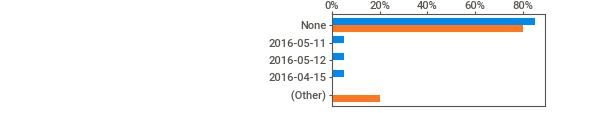
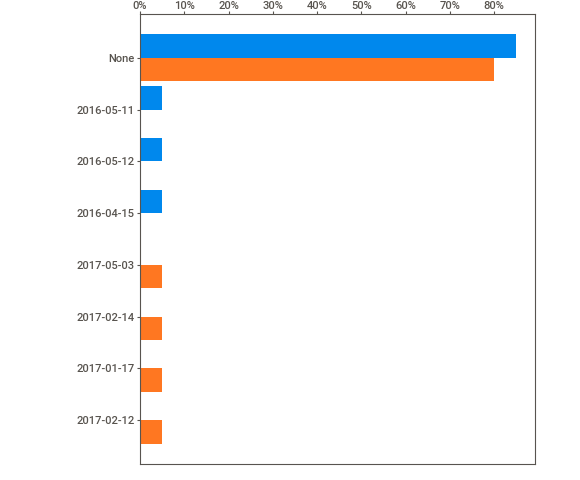
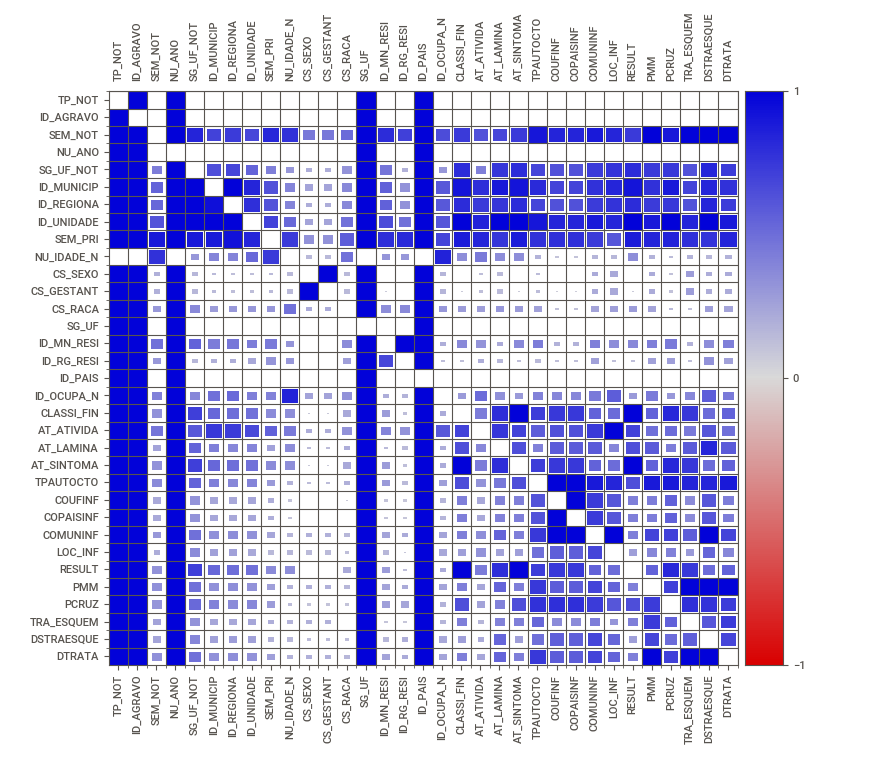
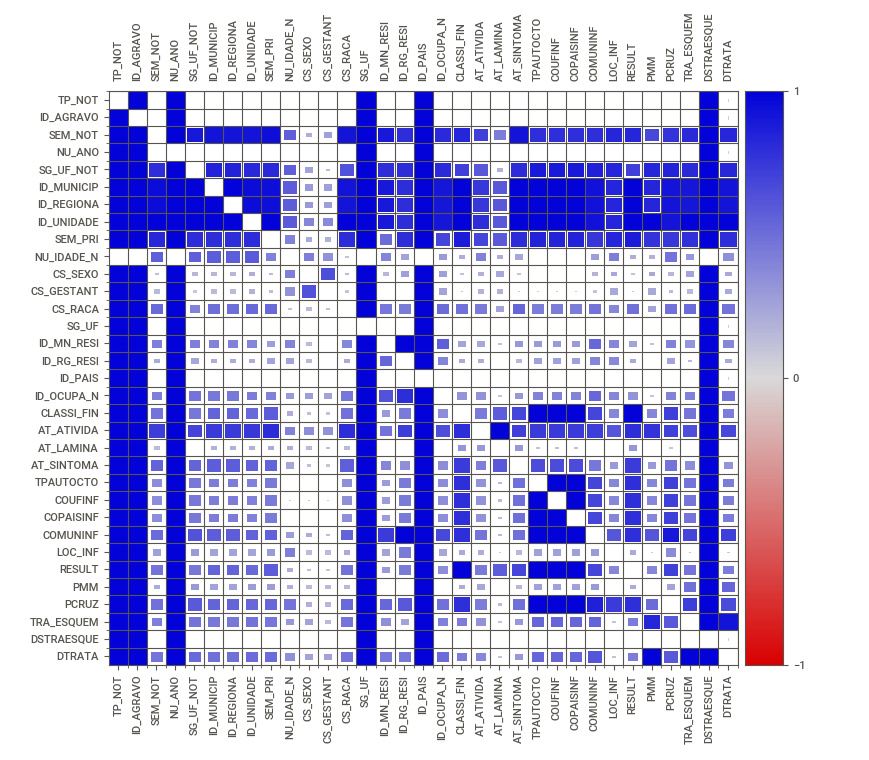

In [30]:
comparison_report.show_notebook()